# Laboratory #09 : Object Detection with YOLO

At the end of this laboratory, you would get familiarized with

*   Object Detection
*   YOLO for Object Detection using **ultralytics YOLO**

**Remember this is a graded exercise.**

*   For every plot, make sure you provide appropriate titles, axis labels, legends, wherever applicable.
*   Create reusable functions where ever possible, so that the code could be reused at different places.
*   Add sufficient comments and explanations wherever necessary.
*   **Once you have the code completed, use GPU to train model faster.**

---

# **Students** (First Name and Last Name)

1. Marc Gonzalez Vidal
2. Oriol Miró Feliu-Lopez

---

# YOLO for Object Detection

*   There are several open source implementations of each version of YOLO.
*   For this exercise, we **would not be implementing the YOLO** from scratch as it is a challenging model and requires many customized elements.
*   We would use the ultralytics YOLO framework - Very efficient, versatile framework providing end to end implementation and support functions. They have improved YOLO since YOLOv8.
*   More details about ultralytics can be found [here](https://docs.ultralytics.com/)
*   Read [You Only Look Once: Unified, Real-Time Object Detection](https://arxiv.org/pdf/1506.02640) and [YOLOv3: An Incremental Improvement](https://arxiv.org/pdf/1804.02767v1) for better understanding of the current improvements. Although we have several versions of YOLO, this gives you the basic knowledge about YOLO.

## Quickstart Installation

Install using pip or directly install from the GitHub repository (development version).

In [ ]:
# Install the ultralytics package from PyPI

!pip install ultralytics

## Creating YOLO model from scratch

In [ ]:
from ultralytics import YOLO

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [ ]:
# All implementations and parameters are controlled through this yaml file.

model = YOLO("yolo11n.yaml")

In [ ]:
# Logs or returns information about the model.

model.info()

YOLO11n summary: 319 layers, 2,624,080 parameters, 2,624,064 gradients, 6.6 GFLOPs


(319, 2624080, 2624064, 6.614336)

Ultralytics YOLO11 pretrained Detection has the following models
- YOLO11n, YOLO11s, YOLO11m, YOLO11l, YOLO11x.

Load each model using the corresponding yaml file and list the summary of each model

In [ ]:
# solution
type_of_model = ["n", "s", "m", "l", "x"]

for type_yolo in type_of_model:
  model = YOLO("yolo11" +  type_yolo + ".yaml")
  model.info();

YOLO11n summary: 319 layers, 2,624,080 parameters, 2,624,064 gradients, 6.6 GFLOPs
YOLO11s summary: 319 layers, 9,458,752 parameters, 9,458,736 gradients, 21.7 GFLOPs
YOLO11m summary: 409 layers, 20,114,688 parameters, 20,114,672 gradients, 68.5 GFLOPs
YOLO11l summary: 631 layers, 25,372,160 parameters, 25,372,144 gradients, 87.6 GFLOPs
YOLO11x summary: 631 layers, 56,966,176 parameters, 56,966,160 gradients, 196.0 GFLOPs


  The config file for YOLO v11 can be found [here](https://github.com/ultralytics/ultralytics/blob/main/ultralytics/cfg/models/11/yolo11.yaml).

  *    What is the role of Backbone?
  *    what is the role of "Head" layers?

**Solution**

*    What is the role of Backbone?

The role of Backbone is to extract all the features that the model need to "understand" the images needed through convolutional layers and also through other complex layers such as C3k2.

*    What is the role of Head layers?

The role of Head layers is to combine all the features extracted in the Backbone, process it and finally generate the final predictions of the model.

## Predictions using Pretrained model weights

In [ ]:
# load a pretrained model - pretrained in MSCOCO
# let us use the 11n version

model = YOLO("yolo11n.yaml").load("yolo11n.pt")  # this loads the official model

# loading a custom model is just changing the checkpoint path

100%|██████████| 5.35M/5.35M [00:00<00:00, 49.7MB/s]


Transferred 499/499 items from pretrained weights


In [ ]:
# Different inference sources can be found here
# https://docs.ultralytics.com/modes/predict/#inference-sources

results = model("https://ultralytics.com/images/bus.jpg")

100%|██████████| 134k/134k [00:00<00:00, 7.13MB/s]


image 1/1 /content/bus.jpg: 640x480 4 0s, 1 5, 44.7ms
Speed: 11.4ms preprocess, 44.7ms inference, 663.6ms postprocess per image at shape (1, 3, 640, 480)


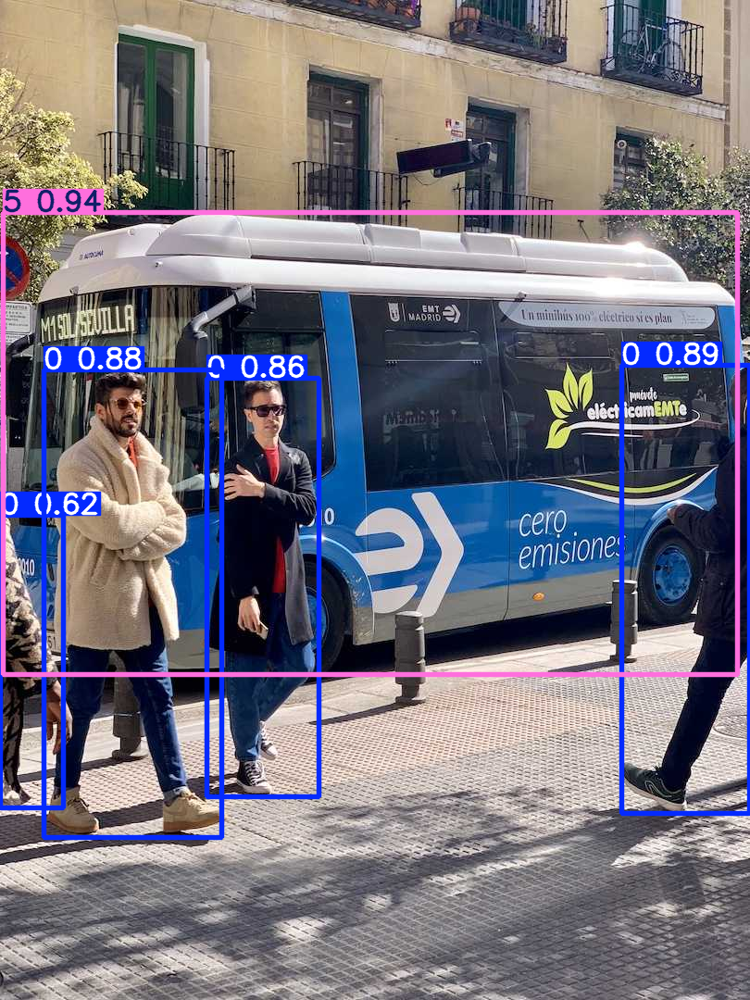

In [ ]:
for result in results:
    boxes = result.boxes  # Boxes object for bounding box outputs
    masks = result.masks  # Masks object for segmentation masks outputs
    keypoints = result.keypoints  # Keypoints object for pose outputs
    probs = result.probs  # Probs object for classification outputs
    obb = result.obb  # Oriented boxes object for OBB outputs
    result.show()  # display to screen
    # result.save(filename="result.jpg") # saving the results

*    Discuss about the inference arguments "conf" and "iou"

**Solution**

The `conf` argument sets the minimum confidence score required for a positive detection. Objects detected with a confidence score below this threshold are disregarded during Non-Maximum Suppression (NMS). This parameter helps reduce false positives by filtering low-confidence predictions. For example, if `conf` is set to 0.9, no objects with confidence scores below 0.9 will be considered.

The `iou` argument determines when two detected boxes are considered to refer to the same object, based on the IoU metric. During NMS, if the IoU between two boxes exceeds the `iou` threshold, they are treated as duplicates, and only the box with the higher confidence score is kept. Lowering the `iou` threshold results in fewer detections, as it relaxes the criteria for boxes to overlap and still be considered separate objects.

In [ ]:
# Display the attribute of the "boxes" variable

print(boxes)

ultralytics.engine.results.Boxes object with attributes:

cls: tensor([5., 0., 0., 0., 0.], device='cuda:0')
conf: tensor([0.9402, 0.8882, 0.8783, 0.8558, 0.6219], device='cuda:0')
data: tensor([[3.8328e+00, 2.2936e+02, 7.9619e+02, 7.2841e+02, 9.4015e-01, 5.0000e+00],
        [6.7102e+02, 3.9483e+02, 8.0981e+02, 8.7871e+02, 8.8822e-01, 0.0000e+00],
        [4.7405e+01, 3.9957e+02, 2.3930e+02, 9.0419e+02, 8.7825e-01, 0.0000e+00],
        [2.2306e+02, 4.0869e+02, 3.4447e+02, 8.6044e+02, 8.5577e-01, 0.0000e+00],
        [2.1739e-02, 5.5607e+02, 6.8886e+01, 8.7236e+02, 6.2192e-01, 0.0000e+00]], device='cuda:0')
id: None
is_track: False
orig_shape: (1080, 810)
shape: torch.Size([5, 6])
xywh: tensor([[400.0137, 478.8882, 792.3618, 499.0481],
        [740.4135, 636.7728, 138.7925, 483.8794],
        [143.3527, 651.8801, 191.8959, 504.6298],
        [283.7633, 634.5623, 121.4087, 451.7471],
        [ 34.4536, 714.2139,  68.8638, 316.2908]], device='cuda:0')
xywhn: tensor([[0.4938, 0.4434, 0.97

*    Explain the variables "cls", "conf", "shape", "xywh" and "data".
*    Explain each dimension(s) of the output

**Solution**

- **Explain the variables "cls", "conf", "shape", "xywh" and "data".**

  - **Cls**: A vector that contains the class ID for each detected object.
  
  - **Conf**: A vector that represents the confidence score for each prediction.
  
  - **Shape**: Refers to the dimensions of the output tensor. For example, the shape `[5, 6]` indicates that there are 5 detections, each described by a 6-element vector.
  
  - **xywh**: A vector that describes the bounding box location. `(x, y)` are the centers of the bounding box, and `w` and `h` represent its width and height: `[x_center, y_center, width, height]`.
  
  - **Data**: A matrix that contains the raw detection information for each object, including bounding box coordinates, confidence score, and class ID. Each row is typically structured as `[x_center, y_center, width, height, confidence, class_id]`.

---

- **Explain each dimension(s) of the output**

  - **Cls**: Dimension `[5]` because there are 5 predicted boxes, and each requires a class ID.
  
  - **Conf**: Dimension `[5]` for the confidence scores corresponding to the 5 predicted boxes.
  
  - **Shape**: Refers to the shape of the entire output tensor, explained earlier (e.g., `[5, 6]`).
  
  - **xywh**: Dimension `[5, 4]` because each bounding box is represented by 4 values (center `x`, center `y`, width, height) for 5 predictions.
  
  - **Data**: Dimension `[5, 6]` because each detection row contains 6 elements (`[x_center, y_center, width, height, confidence, class_id]`) for 5 predictions.

*   Change the conf to 0.9 and compare the inference results


Found https://ultralytics.com/images/bus.jpg locally at bus.jpg
image 1/1 /content/bus.jpg: 640x480 1 5, 12.1ms
Speed: 3.9ms preprocess, 12.1ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 480)


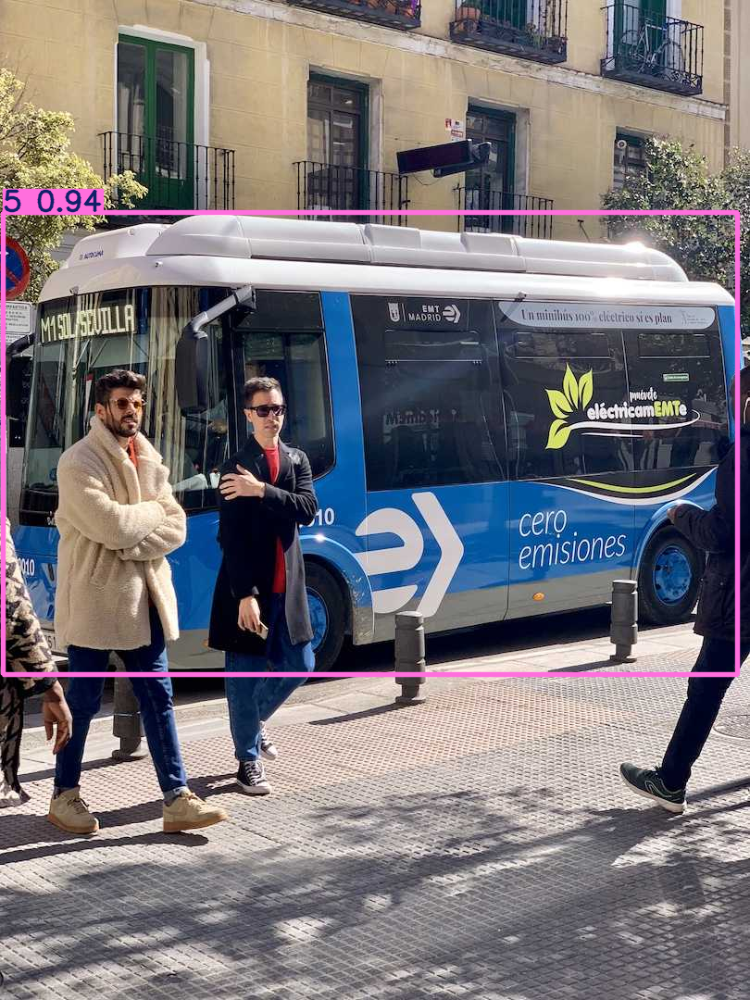

In [ ]:
# solution
results = model.predict("https://ultralytics.com/images/bus.jpg", conf=0.9)

for result in results:
    boxes = result.boxes
    masks = result.masks
    keypoints = result.keypoints
    probs = result.probs
    obb = result.obb
    result.show()  # display to screen
    # result.save(filename="result.jpg") # saving the results


*   What change do you observe after changing the default "conf"?
*   What happens if the "conf" value is set too low?
*   What happens if the "conf" value is set too high?

**Solution**

- **What change do you observe after changing the default "conf"?**  
  We observe that fewer boxes are predicted as the threshold for Non-Maximum Suppression (NMS) becomes stricter. Only boxes with a confidence score higher than the specified value are kept. For example, if the `conf` is set to 0.9, many objects with lower confidence scores, such as people in a crowded scene, may no longer appear in the predictions.

- **What happens if the "conf" value is set too low?**  
  Many false positives will pass through NMS, reducing the overall reliability of the predictions and making the output less useful.

- **What happens if the "conf" value is set too high?**  
  There will be many false negatives, as real objects with slightly lower confidence scores will be filtered out, leading to missed detections.

## YOLO Validation

*    Load pretrained weights of MSCOCO in YOLO11n model
*    Validate on [coco8](https://docs.ultralytics.com/datasets/detect/coco8/) dataset.
    *    It is already available in the framework. Just pass data="coco8.yaml" as an argument.

In [ ]:
# solution
model = YOLO("yolo11n.yaml").load("yolo11n.pt")
metrics = model.val(data="coco8.yaml")

Transferred 499/499 items from pretrained weights
WARNING ⚠️ validating an untrained model YAML will result in 0 mAP.
Ultralytics 8.3.39 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLO11n summary (fused): 238 layers, 2,616,248 parameters, 31,920 gradients, 6.5 GFLOPs

Dataset 'coco8.yaml' images not found ⚠️, missing path '/content/datasets/coco8/images/val'


100%|██████████| 433k/433k [00:00<00:00, 15.5MB/s]
Unzipping /content/datasets/coco8.zip to /content/datasets/coco8...: 100%|██████████| 25/25 [00:00<00:00, 3709.02file/s]

Dataset download success ✅ (0.9s), saved to /content/datasets



100%|██████████| 755k/755k [00:00<00:00, 20.0MB/s]
val: Scanning /content/datasets/coco8/labels/val... 4 images, 0 backgrounds, 0 corrupt: 100%|██████████| 4/4 [00:00<00:00, 1737.49it/s]

val: New cache created: /content/datasets/coco8/labels/val.cache



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.98s/it]


                   all          4         17       0.57       0.85      0.847      0.632
                     0          3         10      0.557        0.6      0.585      0.272
                    16          1          1      0.548          1      0.995      0.697
                    17          1          2      0.531          1      0.995      0.674
                    20          1          2      0.371        0.5      0.516      0.256
                    25          1          1      0.569          1      0.995      0.995
                    58          1          1      0.847          1      0.995      0.895
Speed: 0.3ms preprocess, 19.4ms inference, 0.0ms loss, 1.3ms postprocess per image
Results saved to runs/detect/val


*    You will find several files created in "runs/detect/*"
*    What can you infer from the PR curve figure?

**Solution**

We can infer that some classes, such as 16, 17, 25 and 58 are predicted with high accuracy, precision and recall near 1, while classes 9 and 20 struggle with lower precision and recall.

*    Print mAP50, mAP75, mAP50-95 values.

In [ ]:
# solution

print(metrics.box.map)    # map50-95
print(metrics.box.map50)  # map50
print(metrics.box.map75)  # map75

print(metrics.box.maps)  # a list contains map50-95 of each category

0.6316187870372707
0.8468363715877939
0.6917960426179605
[    0.27239     0.63162     0.63162     0.63162     0.63162     0.63162     0.63162     0.63162     0.63162     0.63162     0.63162     0.63162     0.63162     0.63162     0.63162     0.63162      0.6965     0.67398     0.63162     0.63162     0.25634     0.63162     0.63162     0.63162     0.63162       0.995
     0.63162     0.63162     0.63162     0.63162     0.63162     0.63162     0.63162     0.63162     0.63162     0.63162     0.63162     0.63162     0.63162     0.63162     0.63162     0.63162     0.63162     0.63162     0.63162     0.63162     0.63162     0.63162     0.63162     0.63162     0.63162     0.63162
     0.63162     0.63162     0.63162     0.63162     0.63162     0.63162      0.8955     0.63162     0.63162     0.63162     0.63162     0.63162     0.63162     0.63162     0.63162     0.63162     0.63162     0.63162     0.63162     0.63162     0.63162     0.63162     0.63162     0.63162     0.63162     0.63162
    

*    Plot mAP50-95 for each category using matplotlib.

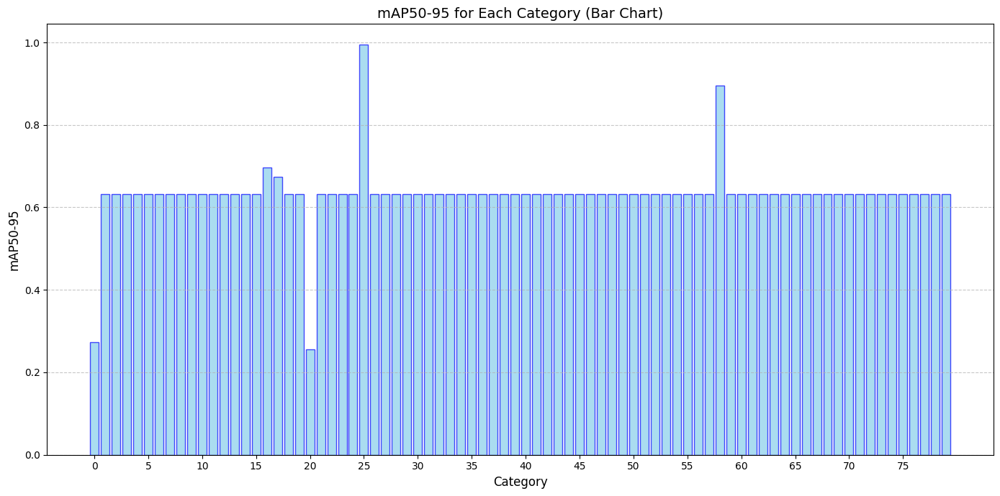

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

maps = metrics.box.maps

categories = np.arange(1, len(maps) + 1)
categories -= 1
plt.figure(figsize=(14, 7))
plt.bar(categories, maps, color='skyblue', edgecolor='blue', alpha=0.7)

plt.title('mAP50-95 for Each Category (Bar Chart)', fontsize=14)
plt.xlabel('Category', fontsize=12)
plt.ylabel('mAP50-95', fontsize=12)
plt.xticks(ticks=(np.arange(1, len(maps) + 1, step=5)-1))
plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()


*    What is mAP?
*    Why do we use differetn mAPs? What details do each one provide?

**Solution**

mAP (mean average precision) is a performance metric used in object detection tasks such as this one, which provides a number that summarizes the precision-recall curve, by this way it reflects how well a model is performing across different threshold levels. AP of a class is the area under the precision-recall curves, and the mAP is this the mean of this AP over all classes.

We use different mAPs as they vary the value of the IoU threshold. This is done, because we could not know which IoU will be optimal for the task before exploration. They provide the mean average precision using their IoU threshold, for example aMP50 uses a threshold of 0.5.


*    Now change the validation set to "signature" dataset and print the mAP.

In [ ]:
metrics = model.val(data="signature.yaml")

WARNING ⚠️ validating an untrained model YAML will result in 0 mAP.
Ultralytics 8.3.39 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Dataset 'signature.yaml' images not found ⚠️, missing path '/content/datasets/signature/valid/images'


100%|██████████| 11.3M/11.3M [00:00<00:00, 63.2MB/s]
Unzipping /content/datasets/signature.zip to /content/datasets/signature...: 100%|██████████| 359/359 [00:00<00:00, 2130.85file/s]

Dataset download success ✅ (1.3s), saved to /content/datasets




val: Scanning /content/datasets/signature/valid/labels... 35 images, 0 backgrounds, 0 corrupt: 100%|██████████| 35/35 [00:00<00:00, 1744.82it/s]

val: New cache created: /content/datasets/signature/valid/labels.cache



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.47it/s]

                   all         35         35          0          0          0          0


Speed: 5.7ms preprocess, 10.6ms inference, 0.0ms loss, 1.6ms postprocess per image
Results saved to runs/detect/val2


In [ ]:
print(metrics.box.map)

0.0


*    What values do you obtain? What do you infer using the values?
*    If low values are returned, what can be the possible reason?

**Solution**

We obtain a mAP50-95 of 0.0, this means that we are not recognizing any signature in the images. This is because althought the we have the architecture in the network loaded, this network is not trained at all as we are neither loading weight for the parameters of the network nor training the network.

## YOLO training

*   In this exercise, the task is to train our YOLO model using the signature dataset.
*   Load the YOLOv11 yaml without the pretrained weights

In [ ]:
# solution
model = YOLO("yolo11n.yaml")

*    Train the model with the given parameters

In [ ]:
results = model.train(data="signature.yaml", epochs=10, imgsz=640)

Ultralytics 8.3.39 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolo11n.yaml, data=signature.yaml, epochs=10, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True, lin

train: Scanning /content/datasets/signature/train/labels... 143 images, 0 backgrounds, 0 corrupt: 100%|██████████| 143/143 [00:00<00:00, 2055.81it/s]

train: New cache created: /content/datasets/signature/train/labels.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


/usr/local/lib/python3.10/dist-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 1.4.21 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
val: Scanning /content/datasets/signature/valid/labels.cache... 35 images, 0 backgrounds, 0 corrupt: 100%|██████████| 35/35 [00:00<?, ?it/s]


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 10 epochs...
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10      2.47G      2.684      5.174       4.64         15        640: 100%|██████████| 9/9 [00:06<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.88it/s]

                   all         35         35   0.000913        0.2   0.000791   0.000432



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10      2.36G      2.619      4.973      4.439         15        640: 100%|██████████| 9/9 [00:02<00:00,  3.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.48it/s]

                   all         35         35   0.000913        0.2   0.000791    0.00034



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10      2.37G      2.523      4.774      4.181         15        640: 100%|██████████| 9/9 [00:04<00:00,  2.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.52it/s]

                   all         35         35   0.000913        0.2   0.000791    0.00034



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10      2.36G      2.481       4.68      4.022         15        640: 100%|██████████| 9/9 [00:03<00:00,  2.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.97it/s]

                   all         35         35   0.000943        0.2   0.000601   0.000365



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10      2.37G      2.348      4.507      3.853         15        640: 100%|██████████| 9/9 [00:02<00:00,  3.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  7.23it/s]

                   all         35         35   0.000935        0.2   0.000921   0.000436



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10      2.37G      2.276      4.316      3.709         15        640: 100%|██████████| 9/9 [00:02<00:00,  3.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.25it/s]

                   all         35         35   0.000913        0.2   0.000932   0.000403



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10      2.37G      2.287      4.076      3.558         15        640: 100%|██████████| 9/9 [00:02<00:00,  3.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.99it/s]

                   all         35         35   0.000917        0.2    0.00125   0.000495



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10      2.37G      2.331      4.024      3.481         15        640: 100%|██████████| 9/9 [00:03<00:00,  2.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.13it/s]

                   all         35         35   0.000944        0.2     0.0013   0.000487



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10      2.37G      2.292      4.027      3.398         15        640: 100%|██████████| 9/9 [00:02<00:00,  3.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.39it/s]

                   all         35         35   0.000931        0.2    0.00101   0.000423



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10      2.37G      2.311      3.902      3.338         15        640: 100%|██████████| 9/9 [00:02<00:00,  4.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.51it/s]

                   all         35         35   0.000946        0.2    0.00119   0.000368



10 epochs completed in 0.015 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 5.4MB
Optimizer stripped from runs/detect/train/weights/best.pt, 5.4MB

Validating runs/detect/train/weights/best.pt...
WARNING ⚠️ validating an untrained model YAML will result in 0 mAP.
Ultralytics 8.3.39 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLO11n summary (fused): 238 layers, 2,582,347 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.99it/s]


                   all         35         35   0.000938        0.2    0.00138   0.000467
Speed: 0.1ms preprocess, 2.4ms inference, 0.0ms loss, 2.1ms postprocess per image
Results saved to runs/detect/train


*    Validate the trained model and print mAP

In [ ]:
metrics = model.val(data="signature.yaml")

WARNING ⚠️ validating an untrained model YAML will result in 0 mAP.
Ultralytics 8.3.39 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLO11n summary (fused): 238 layers, 2,582,347 parameters, 0 gradients, 6.3 GFLOPs


val: Scanning /content/datasets/signature/valid/labels.cache... 35 images, 0 backgrounds, 0 corrupt: 100%|██████████| 35/35 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.46it/s]


                   all         35         35    0.00096        0.2    0.00124   0.000479
Speed: 0.3ms preprocess, 27.7ms inference, 0.0ms loss, 6.3ms postprocess per image
Results saved to runs/detect/train2


In [ ]:
print(metrics.box.map)

0.000478532841103461


*    Do you see an improvement on mAP?
*    If the values are still low, what can we do to improve this model?

**Solution**

We can see a very few improvement but almost anything. This is normal as training a network as YOLO require a lot of data and computational resources, and it is not sufficient with the mini training we have performed with 640 images and 10 epochs, so it is not a good idea to train this network from 0. One solution can be applying transfer learning, which will reuse the knowledge adquired when the network have been training for the original dataset and after that we can finetune to a signature dataset. Therefore all the fetaures learned in the original dataset can be applied to help us in our task.

*    Now load the model with pretrained weights.

In [ ]:
model = YOLO("yolo11n.yaml").load("yolo11n.pt")

Transferred 499/499 items from pretrained weights


*    Train the model with the given parameters

In [ ]:
results = model.train(data="signature.yaml", epochs=10, imgsz=640)

Ultralytics 8.3.39 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolo11n.yaml, data=signature.yaml, epochs=10, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train3, exist_ok=False, pretrained=yolo11n.pt, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=Tr

train: Scanning /content/datasets/signature/train/labels.cache... 143 images, 0 backgrounds, 0 corrupt: 100%|██████████| 143/143 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/datasets/signature/valid/labels.cache... 35 images, 0 backgrounds, 0 corrupt: 100%|██████████| 35/35 [00:00<?, ?it/s]


Plotting labels to runs/detect/train3/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train3
Starting training for 10 epochs...
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10      2.51G      1.186      4.132      1.361         15        640: 100%|██████████| 9/9 [00:03<00:00,  2.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.52it/s]

                   all         35         35    0.00314      0.943      0.614      0.571



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10      2.34G     0.5776      2.516     0.8896         15        640: 100%|██████████| 9/9 [00:03<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.13it/s]

                   all         35         35    0.00314      0.943      0.922      0.862



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10      2.37G     0.5354      1.766     0.8623         15        640: 100%|██████████| 9/9 [00:03<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.19it/s]


                   all         35         35    0.00333          1      0.979      0.859

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10      2.34G     0.5216      1.602     0.8407         15        640: 100%|██████████| 9/9 [00:02<00:00,  3.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.18it/s]

                   all         35         35     0.0081          1      0.977      0.926



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10      2.37G     0.4918      1.464     0.8479         15        640: 100%|██████████| 9/9 [00:02<00:00,  4.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.81it/s]

                   all         35         35          1       0.89      0.973      0.864



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10      2.35G     0.4801      1.393      0.824         15        640: 100%|██████████| 9/9 [00:02<00:00,  4.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.54it/s]

                   all         35         35          1      0.917      0.945      0.868



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10      2.35G     0.4926      1.362     0.8421         15        640: 100%|██████████| 9/9 [00:03<00:00,  2.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.85it/s]

                   all         35         35      0.994      0.943      0.974      0.865



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10      2.35G     0.4498      1.325     0.8387         15        640: 100%|██████████| 9/9 [00:03<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.51it/s]


                   all         35         35          1       0.97      0.995      0.863

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10      2.35G      0.445      1.233     0.8062         15        640: 100%|██████████| 9/9 [00:02<00:00,  4.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.22it/s]

                   all         35         35          1      0.967      0.994      0.899



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10      2.35G     0.4018      1.199     0.8156         15        640: 100%|██████████| 9/9 [00:02<00:00,  4.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.72it/s]

                   all         35         35          1      0.969      0.995       0.93



10 epochs completed in 0.020 hours.
Optimizer stripped from runs/detect/train3/weights/last.pt, 5.4MB
Optimizer stripped from runs/detect/train3/weights/best.pt, 5.4MB

Validating runs/detect/train3/weights/best.pt...
WARNING ⚠️ validating an untrained model YAML will result in 0 mAP.
Ultralytics 8.3.39 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLO11n summary (fused): 238 layers, 2,582,347 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.86it/s]


                   all         35         35          1      0.969      0.995       0.93
Speed: 0.1ms preprocess, 2.2ms inference, 0.0ms loss, 1.3ms postprocess per image
Results saved to runs/detect/train3


*    Validate the trained model and print mAP

In [ ]:
metrics = model.val(data="signature.yaml")

WARNING ⚠️ validating an untrained model YAML will result in 0 mAP.
Ultralytics 8.3.39 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLO11n summary (fused): 238 layers, 2,582,347 parameters, 0 gradients, 6.3 GFLOPs


val: Scanning /content/datasets/signature/valid/labels.cache... 35 images, 0 backgrounds, 0 corrupt: 100%|██████████| 35/35 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.40it/s]


                   all         35         35          1      0.969      0.995      0.933
Speed: 0.2ms preprocess, 14.2ms inference, 0.0ms loss, 8.4ms postprocess per image
Results saved to runs/detect/train32


In [ ]:
print(metrics.box.map)

0.9325052838879004


*    Given the three models we have used so far - pretrained model, model trained from scratch and models starting with pretrained weights.
*    What do you think is the best use case for each of the three?

**Solution**

The first model without transfer lerning neither training, it can also be useful for experimental or research reasons as testing the arquitecture or debbuging or even to try different parameter initialization methods, but not to solve our task.

The second approach (training us the model) can be a good a approach only if the task we are trying to solve is not very easy or if you have sufficient data and computational resources, but usually it is not common, and less for the new models.

The last approach is the best one as we are using models that have been already trained and we can use their knowledge to solve other tasks only doing a little finetuning. Therefore amateur or programming enthusiasts can use this technology without the need of having a supercomputer at home.

## Tensorboard Visualization

*   Ultralytics has three types of loggers - Comet, ClearML, and TensorBoard.
*   Tensorboard is a visualization toolkit that allows for tracking and visualizing metrics such as loss and accuracy.
*   We would get introduced to tensorboard visualization here.
*   More information about Tensorboard can be seen [here](https://www.tensorflow.org/tensorboard)

In [ ]:
# Load the TensorBoard notebook extension

%load_ext tensorboard

*   If your tensorboard does not load, try to follow the following gif.

![](https://i.stack.imgur.com/ENl6b.gif)

In [ ]:
# Visualize the training curves
# you can find the different loss curves by selecting custom scalars option
# in the top right drop down

%tensorboard --logdir /content/runs/detect/

Output hidden; open in https://colab.research.google.com to view.

# Understanding Object Detection

*    Explain each stage of YOLO briefly (Use the base version: [You Only Look Once: Unified, Real-Time Object Detection](https://arxiv.org/pdf/1506.02640)).

**Solution**

First the system divides every image into a grid SxS where each cell is responsible of predicting the bounding boxes that the center is inside them. Each cell predicts B bounding boxes and also the confidence for this ones. The confidence score is the probability to have an object of a class "i" multiplied by the IoU between the predicted bounding box and the real bounding box of the object. This scores encode both the probability of the class appearing in the bounding box and also the IoU (how well is fitting the object the bounding box).

*   Explain the box loss and class loss used in YOLO

### **Solution**

#### **Box Loss**

Box loss is computed as follows:

$$
\text{Box Loss} = \lambda_{\text{coord}} \sum_{i=1}^{S^2} \sum_{j=1}^B \mathbb{1}_{ij}^{\text{obj}} \Big( (x_i - \hat{x}_i)^2 + (y_i - \hat{y}_i)^2 \Big) + \lambda_{\text{coord}} \sum_{i=1}^{S^2} \sum_{j=1}^B \mathbb{1}_{ij}^{\text{obj}} \Big( (\sqrt{w_i} - \sqrt{\hat{w}_i})^2 + (\sqrt{h_i} - \sqrt{\hat{h}_i})^2 \Big)
$$

The first part of the bounding box loss applies the MSE (mean squared error) between the center coordinates of the predicted bounding box and the ground truth. This term is scaled by the factor $$ \lambda_{\text{coord}} $$, which is used to give more weight to the bounding box error relative to the classification error.

The second part of the formula computes the MSE for the width and height, but it uses the square root of these values. This is because they want to give more weight to small changes in small bounding boxes, as these changes are more significant compared to the same change in large bounding boxes. This part also includes the factor $$\lambda_{\text{coord}}$$.

#### **Class Loss**

Class loss is computed as follows:

$$
\text{Class Loss} = \sum_{i=1}^{S^2} \mathbb{1}_{i}^{\text{obj}} \sum_{c \in \text{classes}} \Big( p_i(c) - \hat{p}_i(c) \Big)^2 + \lambda_{\text{noobj}} \sum_{i=1}^{S^2} \mathbb{1}_{i}^{\text{noobj}} \Big( C_i - \hat{C}_i \Big)^2
$$

As before, we can see that the class loss has two parts, both of which use the MSE. The first part considers only the cells where an object is detected ($$ \mathbb{1}_{i}^{\text{obj}} = 1 $$) and computes the error between the predicted class probabilities and the ground truth.

The second part deals with cells where no object is detected ($$ \mathbb{1}_{i}^{\text{noobj}} = 1 $$). Here, the confidence scores are pushed towards 0, ensuring that the model does not overemphasize gradients from cells without objects. The term $$ \lambda_{\text{noobj}} $$ controls the weight of this contribution.


## Evolution of YOLO

*   The current version of YOLO is YOLO11 (Released Sept. 30, 2024)?
*   From the initial versions to the current version, what technical differences are made in each version? (Be brief, don't go in detail)
*   Reference: [History of YOLO](https://docs.ultralytics.com/#yolo-a-brief-history)

**Solution**

- **v2**: Included batch normalization, anchor boxes, and dimension clustering.
- **v3**: Used a more efficient backbone network, multiple anchors, and spatial pyramid pooling.
- **v4**: Introduced Mosaic data augmentation, an anchor-free detection head, and a new loss function.
- **v5**: Improved model performance and added features such as hyperparameter optimization, integrated experiment tracking, and automatic export to popular formats.
- **v6**: Was an open-source improved version developed by Meituan.
- **v7**: Expanded tasks to include pose estimation on the COCO keypoints dataset.
- **v8**: Introduced features and improvements that enhanced performance, flexibility, and efficiency.
- **v9**: Introduced innovative methods like Programmable Gradient Information and the Generalized Efficient Layer Aggregation Network.
- **v10**: Advanced real-time object detection with an End-to-End head, eliminating the need for Non-Maximum Suppression.
- **v11**: Further improved performance across multiple tasks, including detection, segmentation, pose estimation, tracking, and classification.


*    The initial version of YOLO used something called "anchor boxes". YOLOv5 incorporated an improvement over it called "AutoAnchor". The recent methods are "anchor-free methods".
*    What is an "anchor box"? How do you see this change in the usage of "anchors" over the different versions of YOLO?

**Solution**

An anchor box is a predefined box used to approximate the size and aspect ratio of objects in an image.

- YOLOv2 introduced anchor boxes for multi-scale object detection.
- YOLOv5 improved anchors with AutoAnchor, automatically optimizing them for the dataset.
- Recent versions use anchor-free methods, allowing models to infer object locations directly, simplifying architecture and improving performance.

*   Compare YOLO with RCNN-like architectures?
*   What other Object Detection frameworks are available today?
*   When do you prefer YOLO?
*   When do you prefer other object detectors?

**Solution**

- Compare YOLO with RCNN-like architectures
  YOLO is a one-stage architecture, meaning feature extraction, bounding box prediction, and classification are performed in a single pipeline. In contrast, RCNN-like architectures are two-stage, where the first stage generates region proposals, and the second stage classifies these proposals and refines their bounding boxes.

- What other Object Detection frameworks are available today
  Besides YOLO, popular object detection frameworks include Faster R-CNN, SSD, RetinaNet, EfficientDet, and CenterNet.

- When do you prefer YOLO
  YOLO is preferred when real-time performance is crucial due to its highly efficient one-stage architecture.

- When do you prefer other object detectors
  Other detectors are preferred when higher accuracy is needed, and computational resources and time are less constrained. For example, Faster R-CNN can be a better choice for tasks requiring precise region proposals and refined bounding boxes.



---

# **End of P09: Object Detection with YOLO**

This notebook is part of **Deliverable 4**

Deadline for Deliverable 4 (P8 and P9) submission in CampusVirtual is: **Monday, the 2nd of December, 2024**
